# Twenty News Groups Attribution Tutorial

In this tutorial we go over a more complex example, where we will do an analysis of the 20 News Groups dataset ([here](https://scikit-learn.org/0.19/datasets/twenty_newsgroups.html)).

This dataset comprises of newsgroups posts on 20 topics. We will be looking at a subset of 12,000 of these posts.

First we load all the modules that we will need.

Make sure that you installed `interpretable_tsne` beforehand!

In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.sparse import csr_matrix
from gensim import models

from interpretable_tsne import tsne
from interpretable_tsne.tsne import TSNE

os.chdir('..')
from src.viz_helpers import plot_attr_20ng
from src.helpers import get_tsne_attributions

%matplotlib

Using matplotlib backend: agg


Lets load our data. 

If you run the following (from home directory), the 20 News Groups dataset will be downloaded and processed into `processed_data.npz`.
This file will appear in the directory specified by `DATA_DIR_20NG` in `set_environment_variables_public.sh`

    bash create_experiment_files.sh

We open this file and load the arrays we will need

In [2]:
data_id = 0 # replace with whatever you set data_id to be
data_dir = 'data/20ng' # replace with DATA_DIR_20NG
arr_obj_file = '{}/{}/processed_data.npz'.format(data_dir, data_id)

with np.load(arr_obj_file, allow_pickle=True) as arr_obj:
    X_reduced = arr_obj['X_reduced'] # PCA reduced data
    labels = arr_obj['labels'] # 20 NG labels
    X_words = arr_obj['X_words'] # List of words in each sentence (after processing)
    attr_mapping = arr_obj['attr_mapping'] # maps the words in the sentence with their position in sent_list (for visualization)
    sent_list = arr_obj['sent_list'] # Original unprocessed sentence
    pca_obj = arr_obj['pca_obj'].item() # pca obj (to get loadings)
    model_dir = arr_obj['model_dir'].item() # directory of word2vec model

labels = pd.Categorical(labels) # convert to categorical

## Fit data to t-SNE

Now lets fit t-SNE to this data.

First we set our random seed for reproducibility.

In [3]:
seed_value = 42  # set the random seed

import os
os.environ['PYTHONHASHSEED'] = str(seed_value)
# 2. Set `python` built-in pseudo-random generator at a fixed value

import random
random.seed(seed_value)

# 3. Set `numpy` pseudo-random generator at a fixed value
import numpy as np
np.random.seed(seed_value)

Next we specify where to save the t-SNE results our results dir.

As with our data, we will specify a `run_id` (to distinguish multiple runs)

In [4]:
run_id = 0
results_dir = 'results/20ng'

We can use this helper function to fit the t-SNE.

Feel free to change the t-SNE hyperparameters as you see fit.

If the t-SNE has already been fit, it will skip this step.

In [5]:
# tSNE params
get_tsne_attributions(seed_value,
                      data_dir,
                      results_dir,
                      run_id,
                      data_id,
                      grad_style='grad_norm',  # We used grad_norm for our experiments,
                      perplexity=30,
                      n_iter=1000,
                      early_exaggeration=4,
                      learning_rate=500)

File found: results/20ng/0/tsne_results_style=grad_norm.npz! Skipping...


Now that we fit our t-SNE (with attributions), lets load it.

In [6]:
path_to_embs = '{}/{}/tsne_results_style={}.npz'.format(results_dir, run_id, 'grad_norm')
arr_obj = np.load(path_to_embs, allow_pickle=True)
out = arr_obj['out'].item()
print('Loaded t-SNE fit on data from here: {}'.format(path_to_embs))

Loaded t-SNE fit on data from here: results/20ng/0/tsne_results_style=grad_norm.npz


Now lets look at the t-SNE embeddings as a scatterplot.

We can to color the embeddings based on what topic the text is labelled as.

In general, we should not use too many different colors in any graph, so lets make our labels more coarse. Based on semantic similarity between the categories, we group them the following way:

Religion:
* 'alt.atheism'
* 'soc.religion.christian'
* 'talk.religion.misc'

Computers:
* 'comp.graphics'
* 'comp.os.ms-windows.misc'
* 'comp.windows.x'
* 'comp.sys.ibm.pc.hardware'
* 'comp.sys.mac.hardware'
* 'sci.crypt'
* 'sci.electronics'

Medicine:
* 'sci.med'

Space:
* 'sci.space'

Sports:
* 'rec.sport.hockey'
* 'rec.sport.baseball'

Vehicles
* 'rec.autos'
* 'rec.motorcycles'

Politics
* 'talk.politics.guns'
* 'talk.politics.mideast'
* 'talk.politics.misc'

Ads
* 'misc.forsale'

In [7]:
label_remap = {'alt.atheism': 'Religion',
               'soc.religion.christian': 'Religion',
               'talk.religion.misc': 'Religion',
               'comp.graphics': 'Computers',
               'comp.os.ms-windows.misc': 'Computers',
               'comp.windows.x': 'Computers',
               'comp.sys.ibm.pc.hardware': 'Computers',
               'comp.sys.mac.hardware': 'Computers',
               'sci.crypt': 'Computers',
               'sci.electronics': 'Computers',
               'sci.med': 'Medicine',
               'sci.space': 'Space',
               'rec.sport.hockey': 'Sports',
               'rec.sport.baseball': 'Sports',
               'rec.autos': 'Vehicles',
               'rec.motorcycles': 'Vehicles',
               'talk.politics.guns': 'Politics',
               'talk.politics.mideast': 'Politics',
               'talk.politics.misc': 'Politics',
               'misc.forsale': 'Ads'
               }
labels = labels.map(label_remap)
_palette = sns.color_palette('husl', len(labels.unique()))
cmap = {c: _palette[i] for i,c in enumerate(labels.unique())}

Now lets see our t-SNE embeddings.

Notice how they cluster according to the label, as expected.

We also see some interesting patterns between the clusters. For example, 'Space' and 'Medicine' are both near 'Computers'. This makes sense as they are all very technical subjects.

Meanwhile, 'Sports', 'Religion' and 'Politics' are all grouped together on the opposite side (perhaps because these are more social-sciencey.)

This begs the question of if we could somehow characterize these observed embeddings.

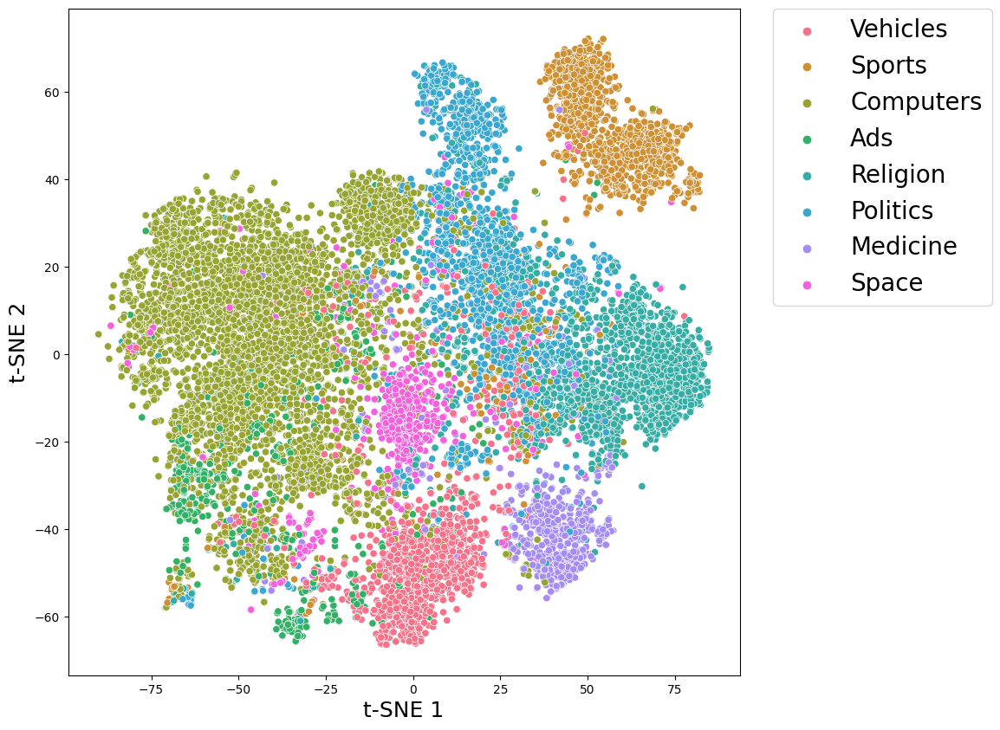

In [8]:
%matplotlib inline

embeddings = out['embeddings'][-1] # only look at last step.
fig, ax = plt.subplots(figsize=(10,10))
data_emb = pd.DataFrame({'t-SNE 1': embeddings[:,0],
                         't-SNE 2': embeddings[:,1],
                         'target': labels})
_ = sns.scatterplot(x='t-SNE 1', y='t-SNE 2', hue='target', data=data_emb, palette=cmap, ax=ax)
_ = ax.set_xlabel('t-SNE 1', fontsize=18)
_ = ax.set_ylabel('t-SNE 2', fontsize=18)
_ = plt.legend(prop={'size': 20}, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
#ax.get_legend().remove()

## Attributions

Perhaps the gradient attributions can yield some insights.

We need to clean these up a bit before using them.

Lets set the nan's to 0 and set the ceiling to 1.

Then, we project from PC space into W2V space. We use the helper function `make_attr` to do so.

In [9]:
def make_attr(pca_obj, attrs):
    # Get the loadings from the PCA object
    loadings = pca_obj.components_ * np.sqrt(pca_obj.explained_variance_).reshape(-1, 1)
    attr_recon = np.matmul(loadings.T, attrs.T).T
    return attr_recon

attrs = out['attrs'][250][0]
attrs[np.isnan(attrs)] = 0 # remove bad attributions
attrs[attrs > 1] = 1 # clip attributions values
attrs[attrs < -1] = -1 # clip attributions values
attr_full = make_attr(pca_obj, attrs)

#  load W2V model
model = models.KeyedVectors.load_word2vec_format(model_dir, binary=True)

Now lets visualize some attributions. We take a random subset of points.

We can visualize what parts of the sentence are significant in the following way:
* First we project the attribution from the Word 2 Vec space into the "Bag of Words" space. We can do this by multiplying the attributions by each word embedding.
* We then map each word attribution score to every instance of the word in the sentence.
* Finally, we overlay the scores over each instance of the word in the sentence.

We also mark which embedding the sentence belongs to.

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
/lustre06/project/6065672/sciclun4/Envs/test_env/lib/python3.8/site-packages/matplotlib/image.py:443: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/lustre06/project/6065672

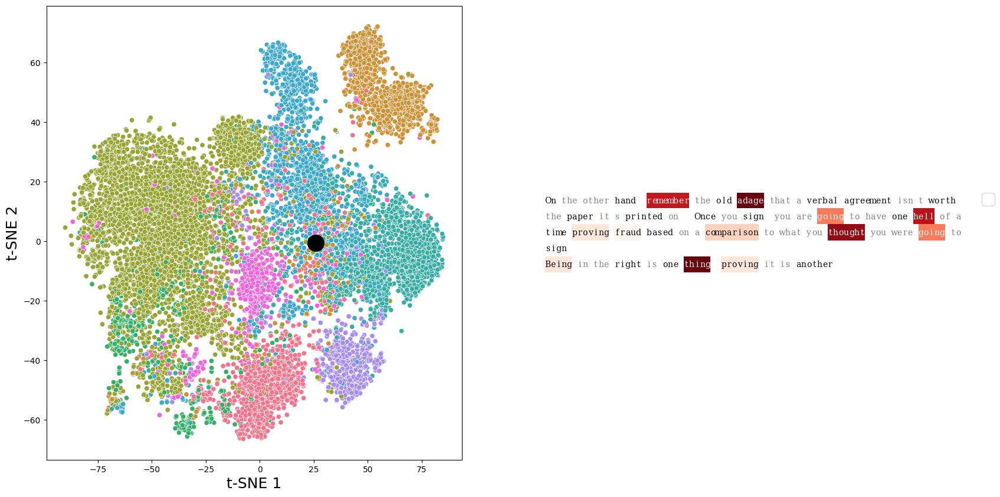

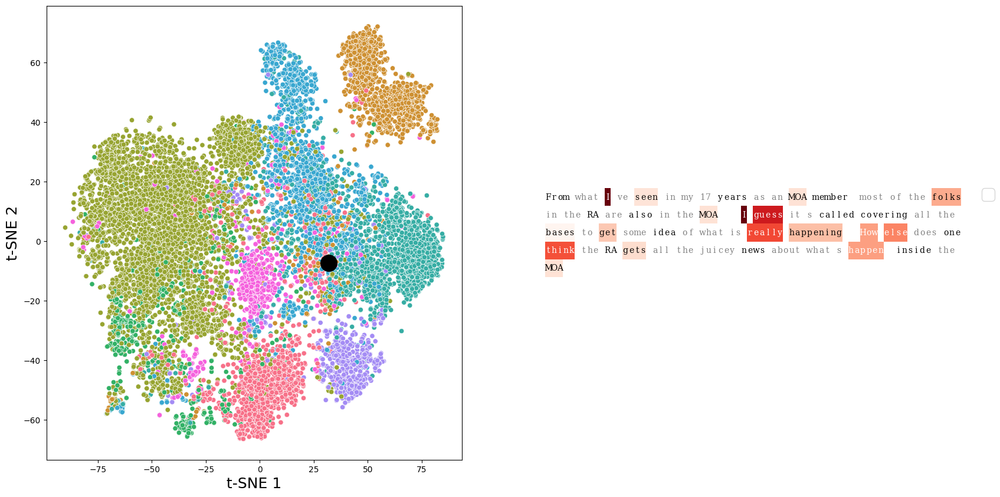

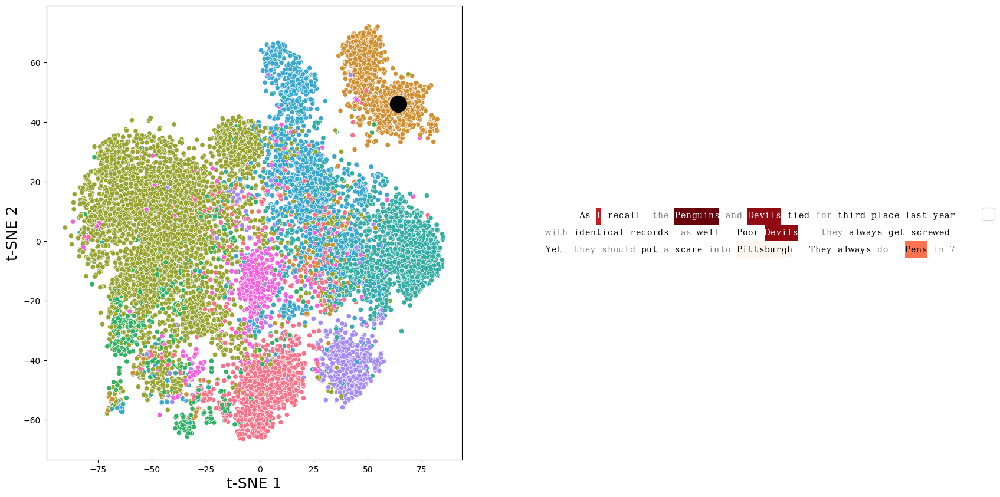

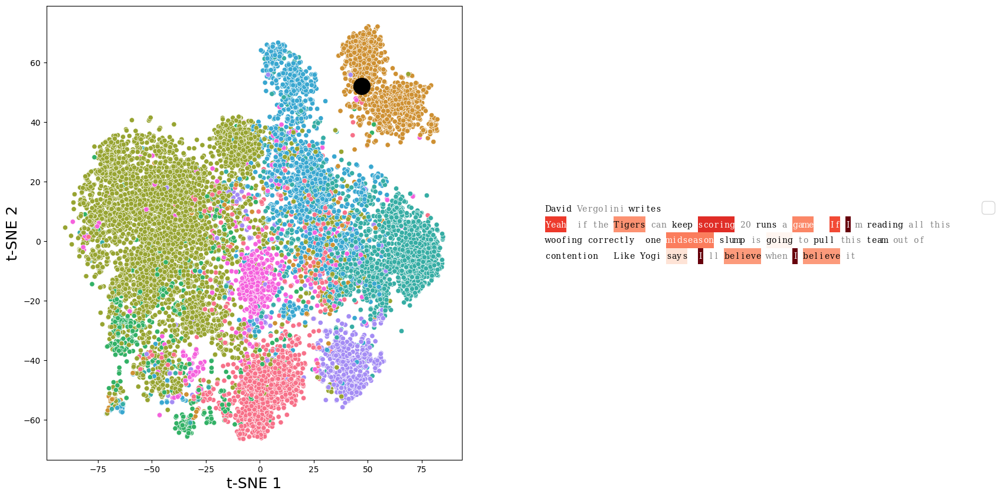

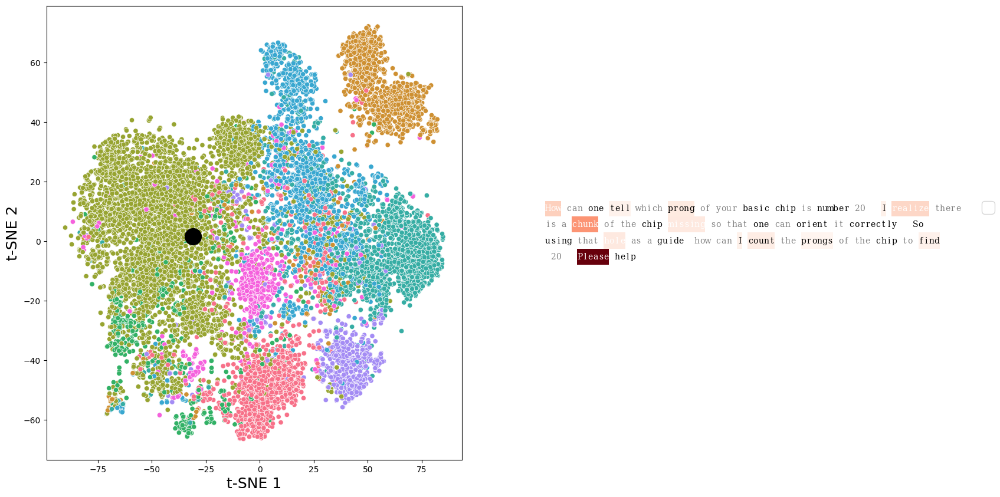

...

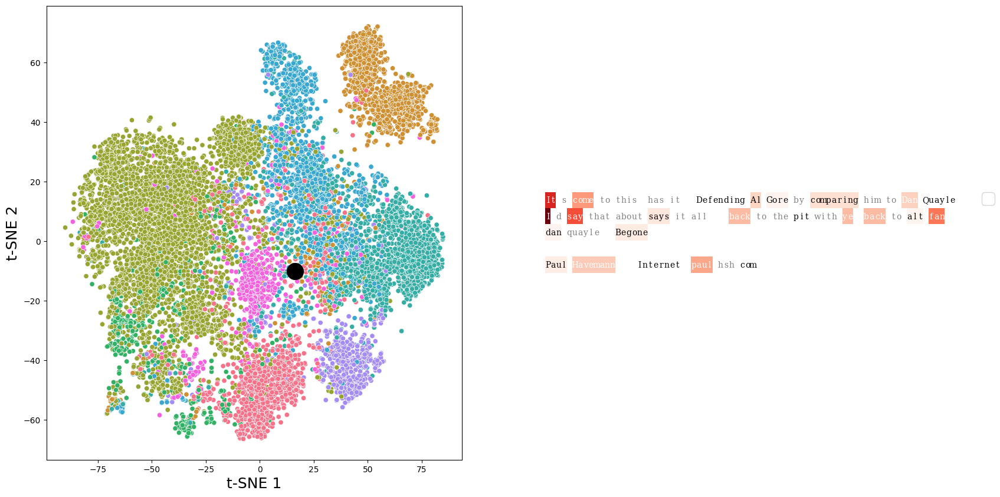

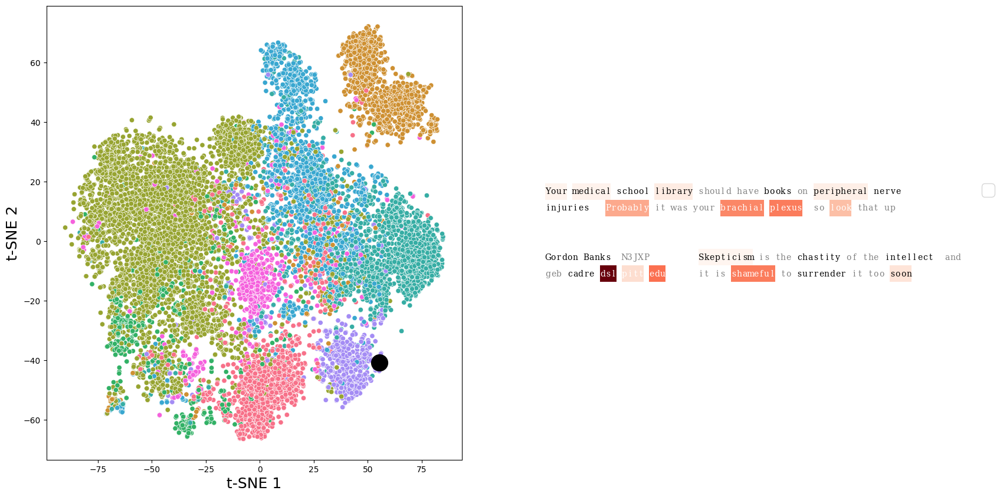

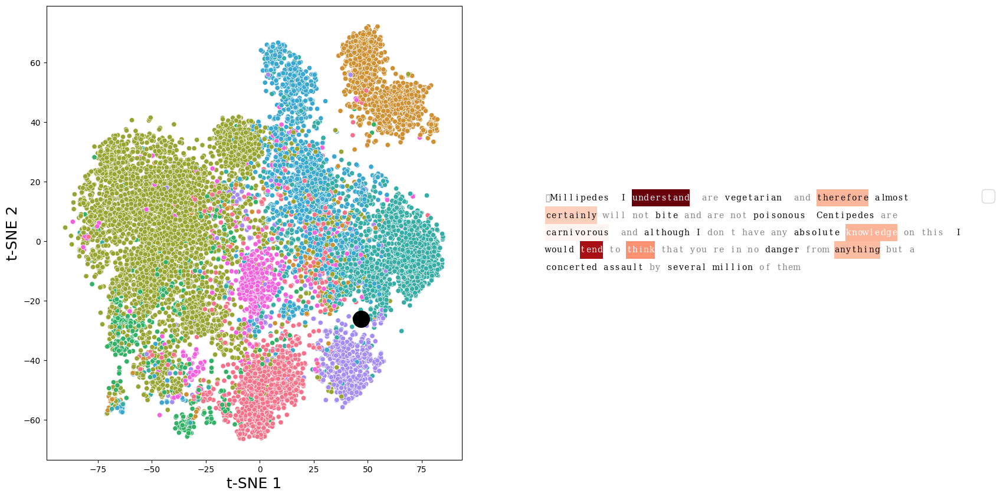

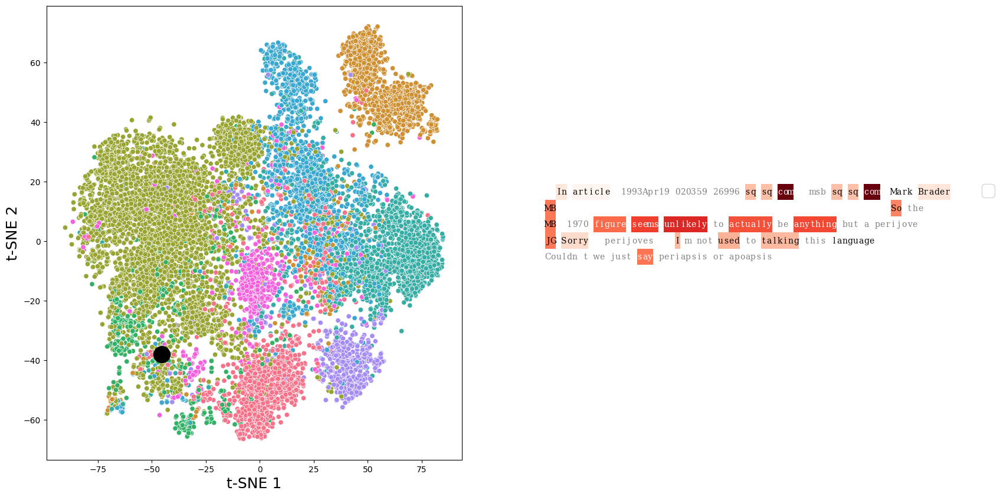

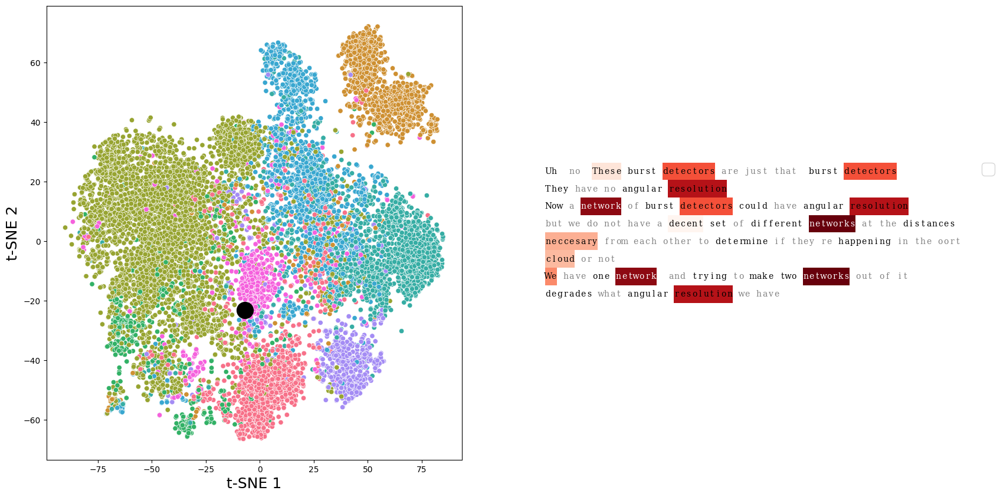

In [16]:
lens = np.array([len(words) for words in X_words])
small_sents_idxs = np.arange(len(lens))[lens <= 25]

for label in labels.unique():
    r_idxs = np.random.choice(small_sents_idxs[labels[small_sents_idxs] == label], 2, replace=False)
    for idx in r_idxs:
        min_percentile_remove=80
        max_percentile_remove=100

        fig, ax = plt.subplots(ncols=2, figsize=(20, 10))

        data_emb = pd.DataFrame({'t-SNE 1': embeddings[:,0],
                                't-SNE 2': embeddings[:,1],
                                'target': labels})
        _ = sns.scatterplot(x='t-SNE 1', y='t-SNE 2', hue='target', data=data_emb, palette=cmap, ax=ax[0])
        _ = ax[0].plot(embeddings[idx ,0], embeddings[idx ,1], marker="o", markersize=20, color='black')
        _ = ax[0].set_xlabel('t-SNE 1', fontsize=18)
        _ = ax[0].set_ylabel('t-SNE 2', fontsize=18)
        _ = plt.legend(prop={'size': 20}, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
        _ = ax[0].get_legend().remove()

        plot_attr_20ng(data=sent_list,
                        words=X_words,
                        attrs=attr_full,
                        idx=idx,
                        model=model,
                        attr_mapping=attr_mapping,
                        ax=ax[1],
                        min_percentile_remove=min_percentile_remove,
                        max_percentile_remove=max_percentile_remove,
                        aspect=3)

# Global and Class Level Attributions

Now lets see what the highest attributed word for each cluster.

First we retrieve the attribution scores per word.

In [11]:
# recover dims
word_embeddings = [np.array([model[doc] for doc in words]) for words in X_words]
attrs_words = np.abs(np.array([(np.stack(word_embeddings[i])@(attr_full[i]).T) for i in range(len(word_embeddings))]))

# map attributions of each word to index
idx_mapping = { s:i for i, s in enumerate(model.index2word)}
indices = [[j, idx_mapping[word]] for j in range(len(X_words)) for word in X_words[j]]
full_attr_mat = csr_matrix((np.concatenate(attrs_words), (np.array(indices)[:,0], np.array(indices)[:,1])), shape=(len(X_words), len(idx_mapping)))

/tmp/ipykernel_1983622/3844342393.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  attrs_words = np.abs(np.array([(np.stack(word_embeddings[i])@(attr_full[i]).T) for i in range(len(word_embeddings))]))


Now lets get the global average attributions per word.

We also get the word frequencies.

Note that we ignore any words with frequency $<5$

In [12]:
global_counts = np.array((full_attr_mat != 0).sum(0)).flatten()

# lets ignore words that appeared less than 5 times
global_counts[global_counts < 5] = 0

global_attrs = np.array(full_attr_mat.mean(0)).flatten()/global_counts
global_attrs[np.isnan(global_attrs)] = 0
global_attrs[np.isinf(global_attrs)] = 0
global_attrs_idxs = global_attrs.argsort()[::-1]
global_freq_idxs = global_counts.argsort()[::-1]

the_attrs = global_attrs[global_attrs_idxs][:20]
the_attr_words = [model.index2word[s] for s in global_attrs_idxs[:20]]
the_freqs = global_counts[global_freq_idxs][:20]
the_freq_words = [model.index2word[s] for s in global_freq_idxs[:20]]

/tmp/ipykernel_1983622/2311528852.py:6: RuntimeWarning: divide by zero encountered in true_divide
  global_attrs = np.array(full_attr_mat.mean(0)).flatten()/global_counts
/tmp/ipykernel_1983622/2311528852.py:6: RuntimeWarning: invalid value encountered in true_divide
  global_attrs = np.array(full_attr_mat.mean(0)).flatten()/global_counts


Notice how the Attributions highlight words that are very class discriminative.

It is not surprising that the words are mostly related to 'Computers' as this is the biggest category.

In contrast, the high frequency words are mostly stopwords that don't tell us anything interesting about our embeddings.

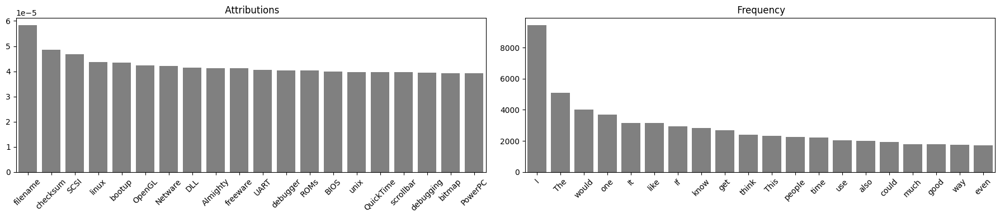

In [13]:
fig, ax = plt.subplots(ncols=2, figsize=(18, 4))
_ = sns.barplot(x=np.arange(20), y=the_attrs, color='grey', ax=ax[0])
_ = sns.barplot(x=np.arange(20), y=the_freqs, color='grey', ax=ax[1])
_ = ax[0].set_xticklabels(the_attr_words, rotation=45)
_ = ax[1].set_xticklabels(the_freq_words, rotation=45)
_ = ax[0].set_title(' Attributions')
_ = ax[1].set_title(' Frequency')
fig.tight_layout()

When we repeat this analysis for all groups, we see the same pattern.

The high attribution words tend to include jargon and other terminology highly associated with the label.

The high frequency words tend to be generic and often non-informative.

Notice that in 'Medicine' and 'Vehicles', we see the word "God" has high attribution.

Perhaps messages from each of these topics often contain this word, and that is why these clusters are adjacent to the 'Religion' cluster.

/tmp/ipykernel_1983622/14836267.py:9: RuntimeWarning: divide by zero encountered in true_divide
  global_attrs = np.array(full_attr_mat[labels == label].mean(0)).flatten()/global_counts
/tmp/ipykernel_1983622/14836267.py:9: RuntimeWarning: invalid value encountered in true_divide
  global_attrs = np.array(full_attr_mat[labels == label].mean(0)).flatten()/global_counts
/tmp/ipykernel_1983622/14836267.py:9: RuntimeWarning: divide by zero encountered in true_divide
  global_attrs = np.array(full_attr_mat[labels == label].mean(0)).flatten()/global_counts
/tmp/ipykernel_1983622/14836267.py:9: RuntimeWarning: invalid value encountered in true_divide
  global_attrs = np.array(full_attr_mat[labels == label].mean(0)).flatten()/global_counts
/tmp/ipykernel_1983622/14836267.py:9: RuntimeWarning: divide by zero encountered in true_divide
  global_attrs = np.array(full_attr_mat[labels == label].mean(0)).flatten()/global_counts
/tmp/ipykernel_1983622/14836267.py:9: RuntimeWarning: invalid value enco

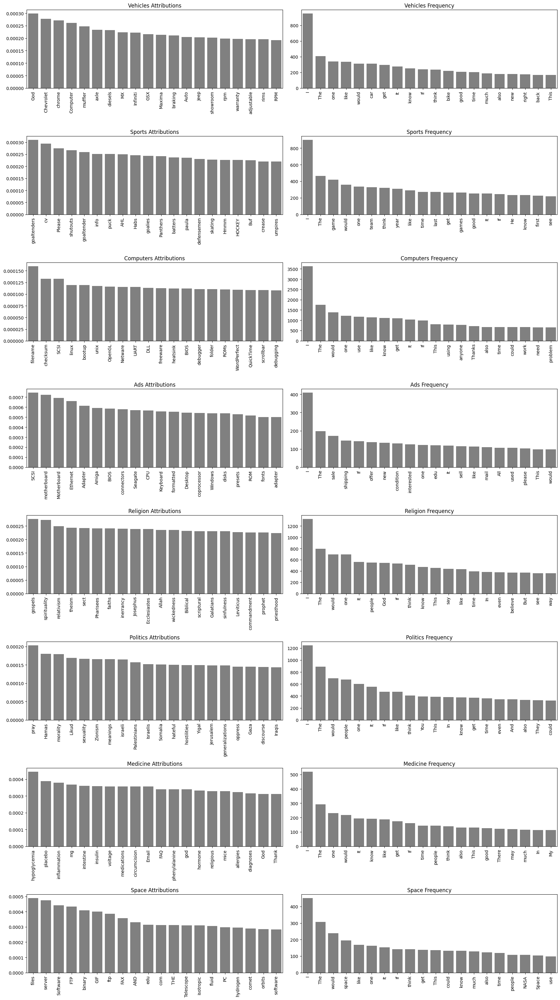

In [14]:
fig, ax = plt.subplots(nrows=len(labels.unique()), ncols=2, figsize=(18, 4*len(labels.unique())))

for i, label in enumerate(labels.unique()):
    global_counts = np.array((full_attr_mat[labels == label] != 0).sum(0)).flatten()

    # lets ignore words that appeared less than 5 times
    global_counts[global_counts < 5] = 0

    global_attrs = np.array(full_attr_mat[labels == label].mean(0)).flatten()/global_counts
    global_attrs[np.isnan(global_attrs)] = 0
    global_attrs[np.isinf(global_attrs)] = 0
    global_attrs_idxs = global_attrs.argsort()[::-1]
    global_freq_idxs = global_counts.argsort()[::-1]

    the_attrs = global_attrs[global_attrs_idxs][:20]
    the_attr_words = [model.index2word[s] for s in global_attrs_idxs[:20]]
    the_freqs = global_counts[global_freq_idxs][:20]
    the_freq_words = [model.index2word[s] for s in global_freq_idxs[:20]]

    _ = sns.barplot(x=np.arange(20), y=the_attrs, color='grey', ax=ax[i, 0])
    _ = sns.barplot(x=np.arange(20), y=the_freqs, color='grey', ax=ax[i, 1])
    _ = ax[i, 0].set_xticklabels(the_attr_words, rotation=90)
    _ = ax[i, 1].set_xticklabels(the_freq_words, rotation=90)
    _ = ax[i, 0].set_title(label + ' Attributions')
    _ = ax[i, 1].set_title(label + ' Frequency')
fig.tight_layout()